1,prepare data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers.core import Dense, Dropout, Activation
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
import numpy
import time


Using TensorFlow backend.


In [2]:
Open=pd.read_csv('SP500_new.csv', usecols=[1],engine='python', skipfooter=1).values.astype('float32')
High=pd.read_csv('SP500_new.csv', usecols=[2],engine='python', skipfooter=1).values.astype('float32')
Low=pd.read_csv('SP500_new.csv', usecols=[3],engine='python', skipfooter=1).values.astype('float32')
Close=pd.read_csv('SP500_new.csv', usecols=[4],engine='python', skipfooter=1).values.astype('float32')
Adjclose=pd.read_csv('SP500_new.csv', usecols=[5],engine='python', skipfooter=1).values.astype('float32')
Vloume=pd.read_csv('SP500_new.csv', usecols=[6],engine='python', skipfooter=1).values.astype('float32')

In [3]:
def preparedata(features):
    
    lenth=len(pd.read_csv('SP500_new.csv', usecols=[1],engine='python', skipfooter=1).values.astype('float32'))
    
    dataX = []
    for i in range(lenth):
        a=[]
        for feature in features:
            a.append(feature[i, 0])
        dataX.append(a)
    dataset=numpy.array(dataX)

    dataY = []
    for i in range(1,lenth):
        a=[]
        a.append(Adjclose[i, 0])
        dataY.append(a)
    target=numpy.array(dataY)

    dataset=dataset[:-1]

    # normalize the dataset
    scaler_dataset = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler_dataset.fit_transform(dataset)

    # normalize the dataset
    scaler_target = MinMaxScaler(feature_range=(0, 1))
    target = scaler_target.fit_transform(target)

    trainX=dataset[:-500]
    testX=dataset[-500:]
    trainY=target[:-500]
    testY=target[-500:]

    # reshape input to be [samples, time steps, features]
    trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
    testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
    return trainX,trainY,testX,testY,scaler_dataset,scaler_target


4.5,tune dropout

In [7]:
repeats=5

dropouts=[0,0.1,0.2,0.3,0.4,0.5]

accuracy plot


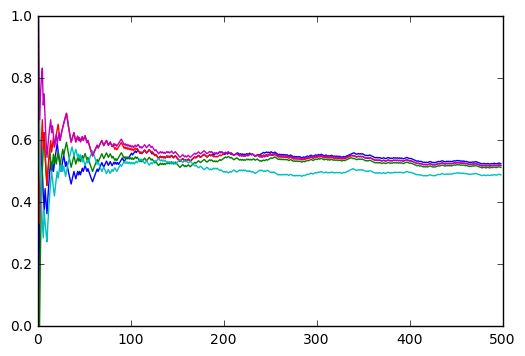

adjclose plot


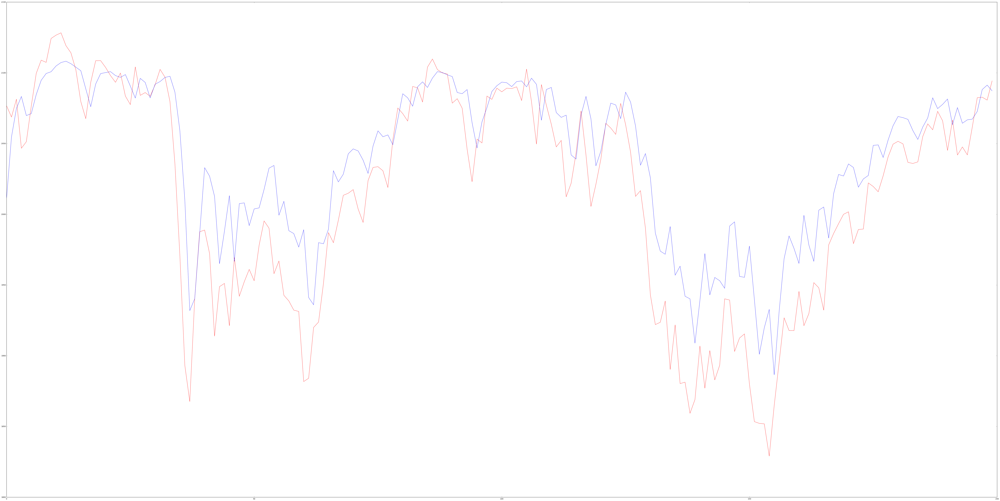

mean of test_RMSE
79.7364304942
std of test_RMSE
22.7701215252
mean of test_r2Score
0.689303416161
std of test_r2Score
0.153160723242
mean of accuracy_all
0.535975291269
std of accuracy_all
0.0197992381753
mean of accuracy_30
0.587096774194
std of accuracy_30
0.0800624106193
accuracy plot


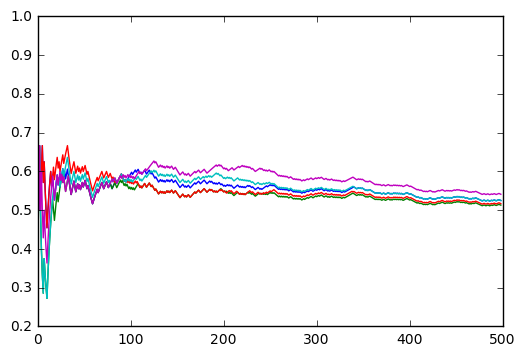

adjclose plot


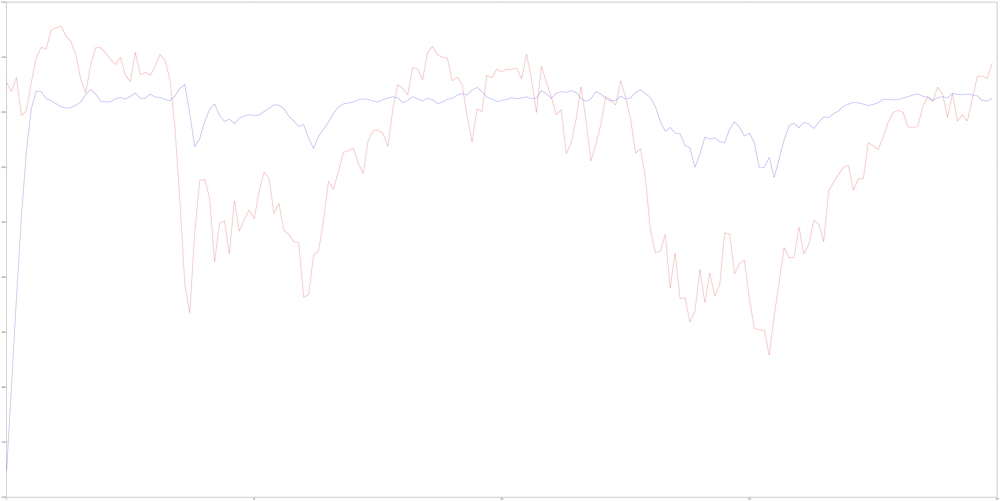

mean of test_RMSE
363.844229337
std of test_RMSE
16.8738952394
mean of test_r2Score
-4.99433292848
std of test_r2Score
0.564474533908
mean of accuracy_all
0.555164204423
std of accuracy_all
0.013173950878
mean of accuracy_30
0.587096774194
std of accuracy_30
0.0376190444829
accuracy plot


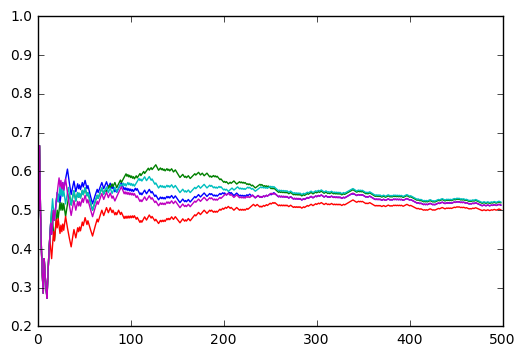

adjclose plot


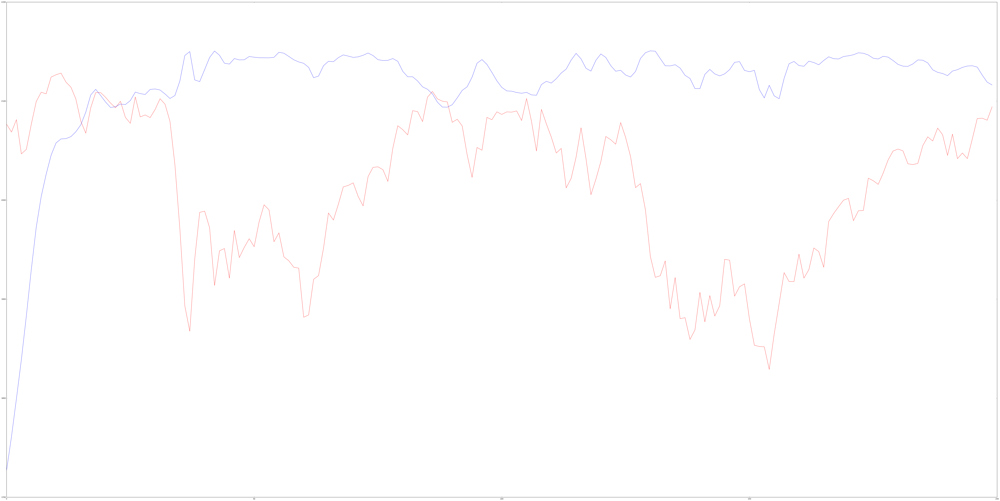

mean of test_RMSE
351.999438357
std of test_RMSE
42.1917878167
mean of test_r2Score
-4.67879191154
std of test_r2Score
1.22563436408
mean of accuracy_all
0.528230788983
std of accuracy_all
0.0185605733782
mean of accuracy_30
0.529032258065
std of accuracy_30
0.0437569676331
accuracy plot


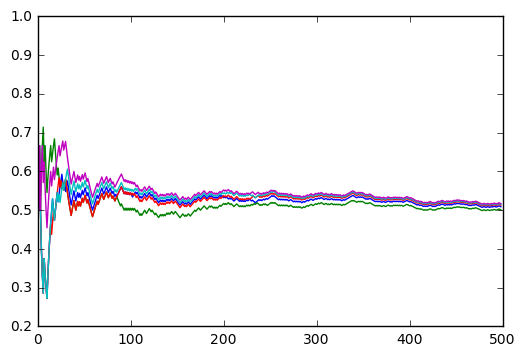

adjclose plot


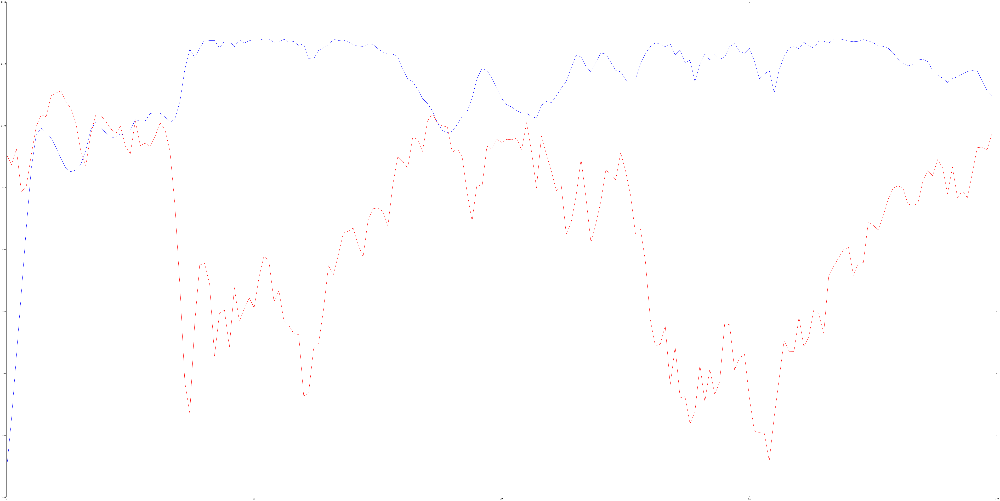

mean of test_RMSE
326.660266293
std of test_RMSE
7.39605811402
mean of test_r2Score
-3.82383010052
std of test_r2Score
0.220053815886
mean of accuracy_all
0.529173797114
std of accuracy_all
0.0106719337271
mean of accuracy_30
0.593548387097
std of accuracy_30
0.0437569676331
accuracy plot


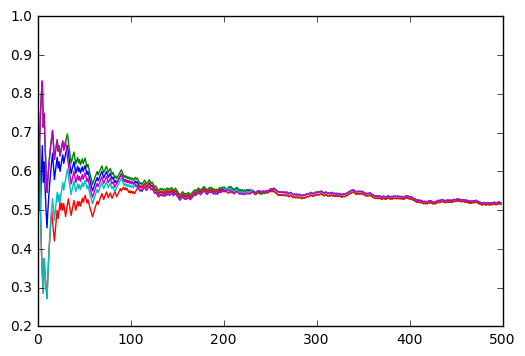

adjclose plot


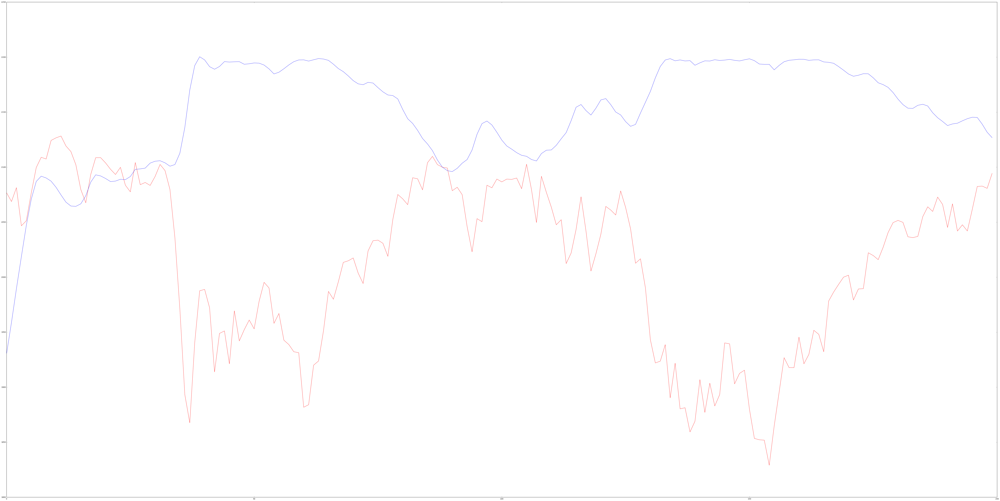

mean of test_RMSE
293.974585244
std of test_RMSE
9.07732991139
mean of test_r2Score
-2.90850137244
std of test_r2Score
0.239345800048
mean of accuracy_all
0.546472320814
std of accuracy_all
0.0099708071887
mean of accuracy_30
0.612903225806
std of accuracy_30
0.0735597048451
accuracy plot


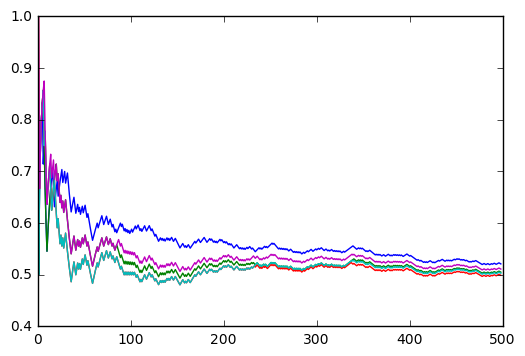

adjclose plot


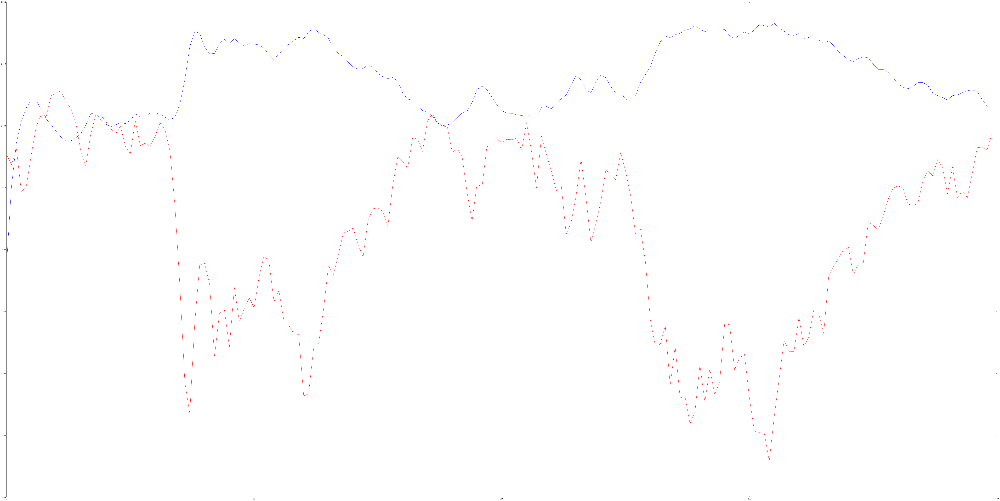

mean of test_RMSE
256.858325774
std of test_RMSE
10.6978975347
mean of test_r2Score
-1.98618559616
std of test_r2Score
0.246989904406
mean of accuracy_all
0.535167055966
std of accuracy_all
0.0169510915325
mean of accuracy_30
0.625806451613
std of accuracy_30
0.0387096774194


NameError: name 'neurons' is not defined

In [8]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for dropout in dropouts:
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
        model.add(Dropout(dropout))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(neurons,test_RMSE_all)
plt.xlabel('neurons')
plt.ylabel('test_RMSE')
plt.show()

plt.plot(neurons,accuracy_all_all)
plt.xlabel('neurons')
plt.ylabel('accuracy_all')
plt.show()


print('time cost')
print( time.time() - start)  

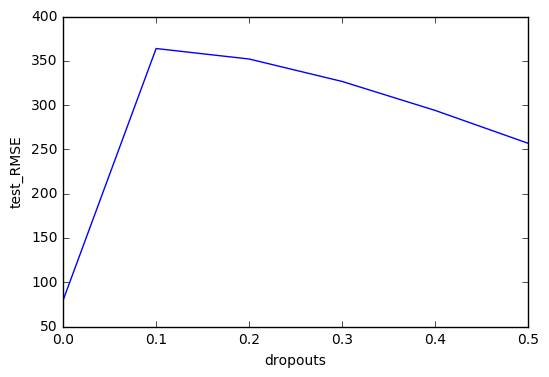

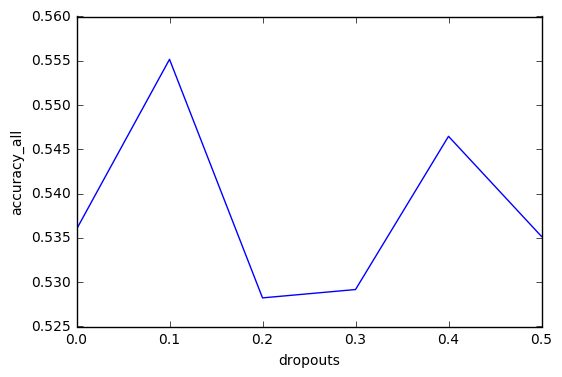

In [9]:
plt.plot(dropouts,test_RMSE_all)
plt.xlabel('dropouts')
plt.ylabel('test_RMSE')
plt.show()

plt.plot(dropouts,accuracy_all_all)
plt.xlabel('dropouts')
plt.ylabel('accuracy_all')
plt.show()

In [ ]:
import winsound
winsound.Beep(300,5000)

4.6 retune epochs

In [10]:
repeats=5
epochs=[50,60,70,80,90,100]

accuracy plot


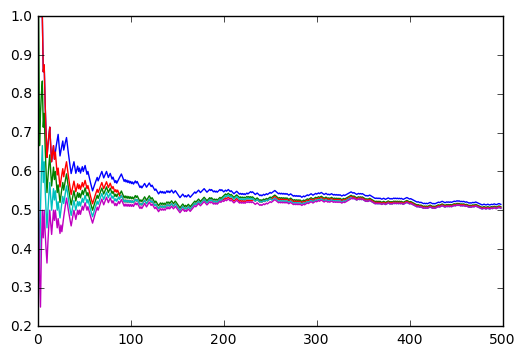

adjclose plot


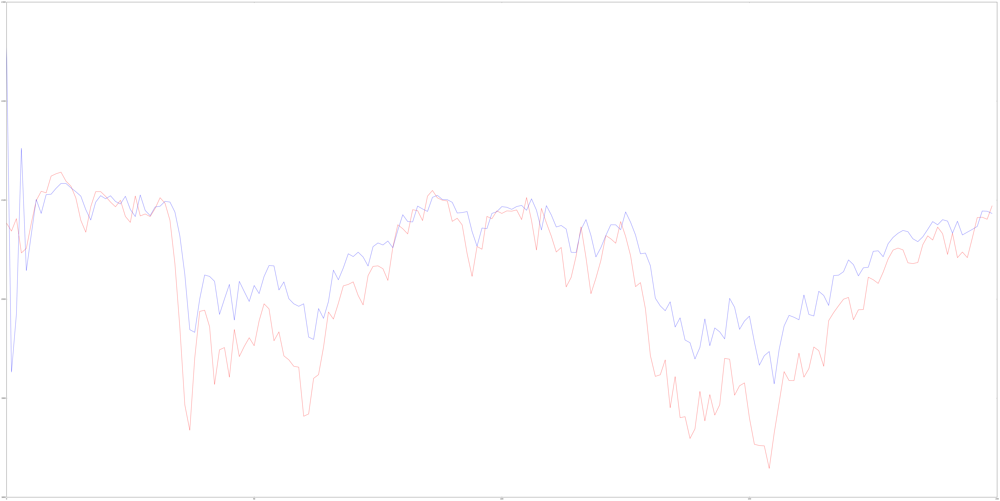

mean of test_RMSE
79.3059232332
std of test_RMSE
8.06776917733
mean of test_r2Score
0.712882634564
std of test_r2Score
0.0543948032219
mean of accuracy_all
0.531874008667
std of accuracy_all
0.0160840101172
mean of accuracy_30
0.587096774194
std of accuracy_30
0.0554988726906
accuracy plot


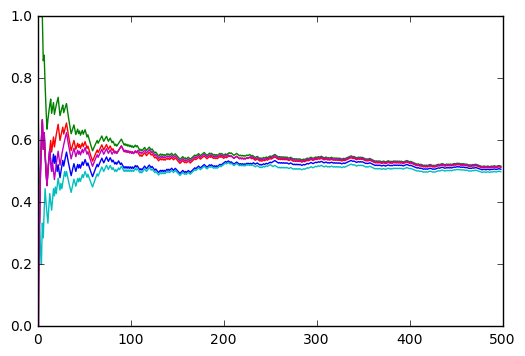

adjclose plot


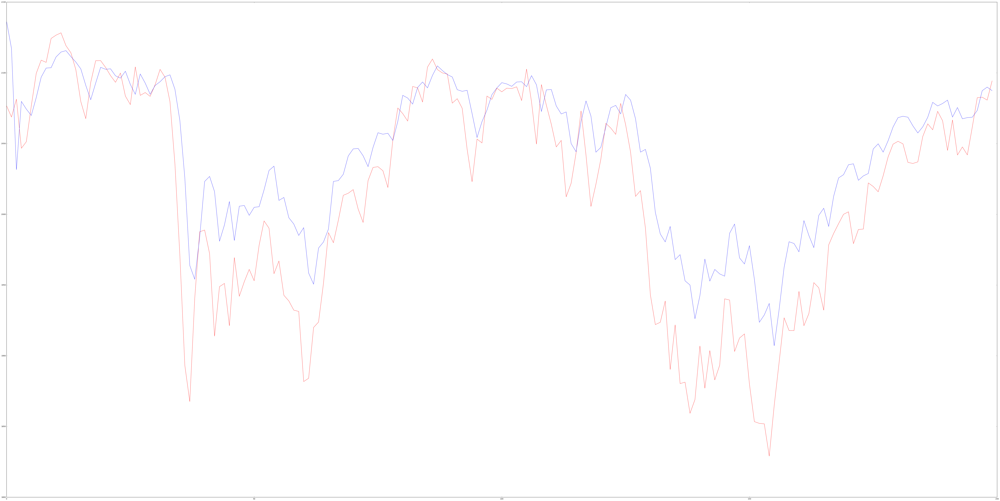

mean of test_RMSE
75.2018032931
std of test_RMSE
3.64942100293
mean of test_r2Score
0.743873283727
std of test_r2Score
0.0249033036909
mean of accuracy_all
0.533574587608
std of accuracy_all
0.021844396547
mean of accuracy_30
0.6
std of accuracy_30
0.0779551353135
accuracy plot


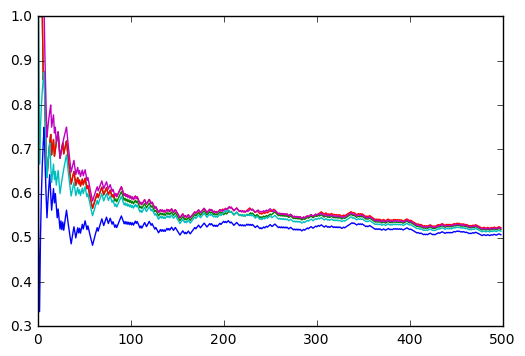

adjclose plot


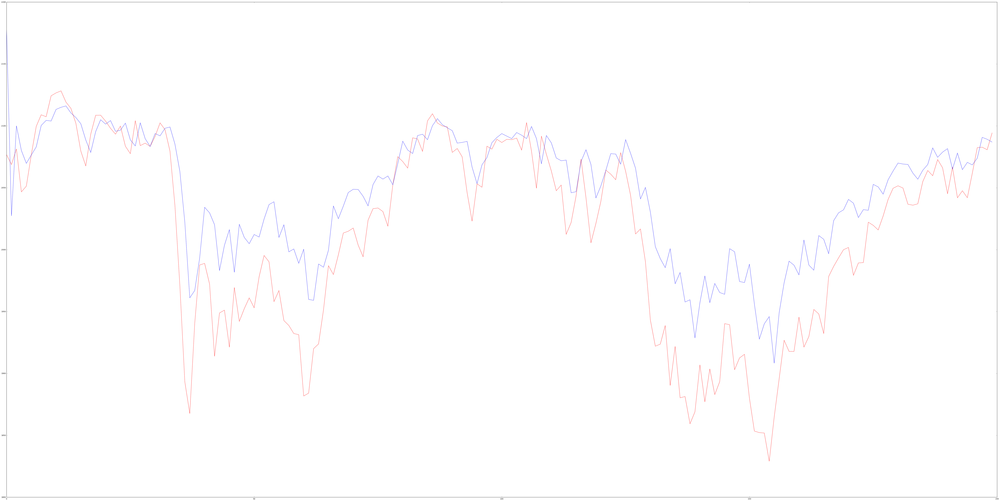

mean of test_RMSE
71.4561888329
std of test_RMSE
7.304201443
mean of test_r2Score
0.766884675959
std of test_r2Score
0.0447913065177
mean of accuracy_all
0.559298190247
std of accuracy_all
0.0180303857017
mean of accuracy_30
0.677419354839
std of accuracy_30
0.0676650869787
accuracy plot


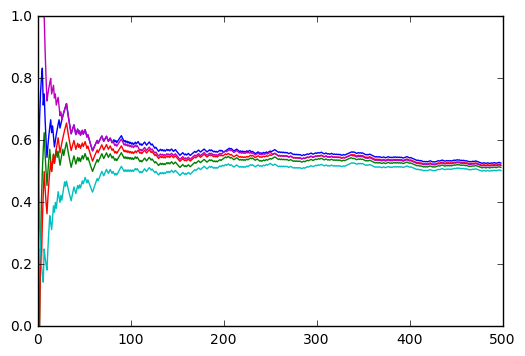

adjclose plot


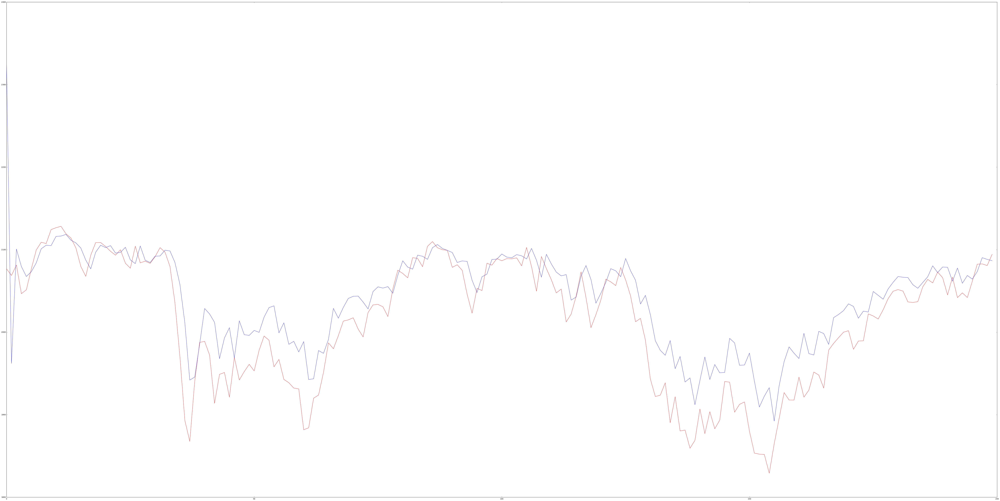

mean of test_RMSE
74.1512820315
std of test_RMSE
5.60834078554
mean of test_r2Score
0.750143046269
std of test_r2Score
0.037399803288
mean of accuracy_all
0.540834271121
std of accuracy_all
0.0271011195733
mean of accuracy_30
0.61935483871
std of accuracy_30
0.0965589003038
accuracy plot


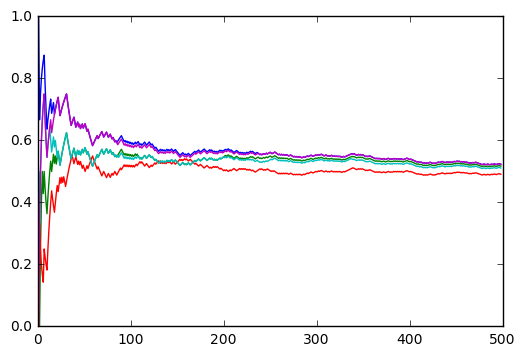

adjclose plot


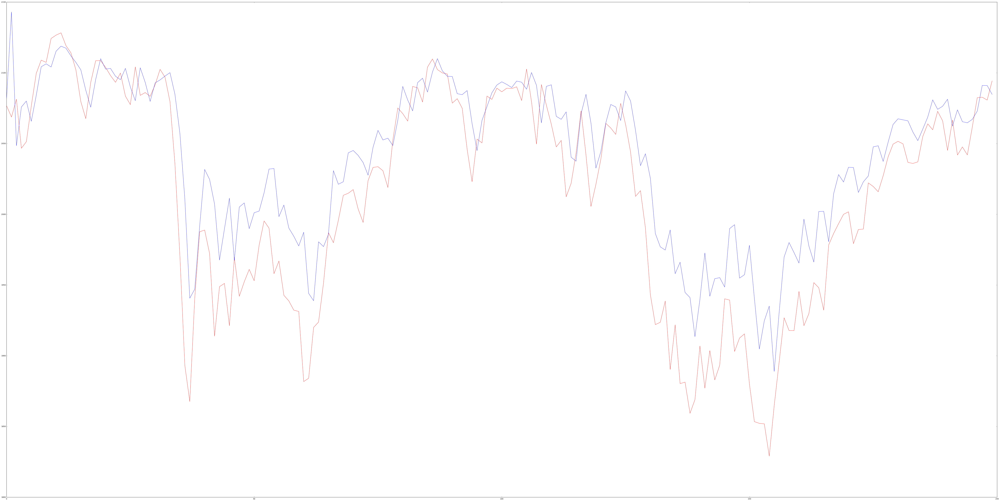

mean of test_RMSE
62.0527401831
std of test_RMSE
12.7054748452
mean of test_r2Score
0.818726356039
std of test_r2Score
0.0642346356421
mean of accuracy_all
0.539990447393
std of accuracy_all
0.0274774908554
mean of accuracy_30
0.632258064516
std of accuracy_30
0.107182243392
accuracy plot


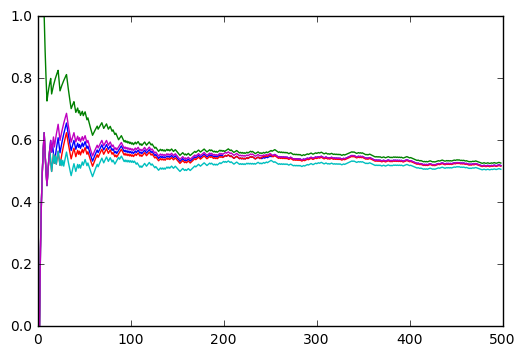

adjclose plot


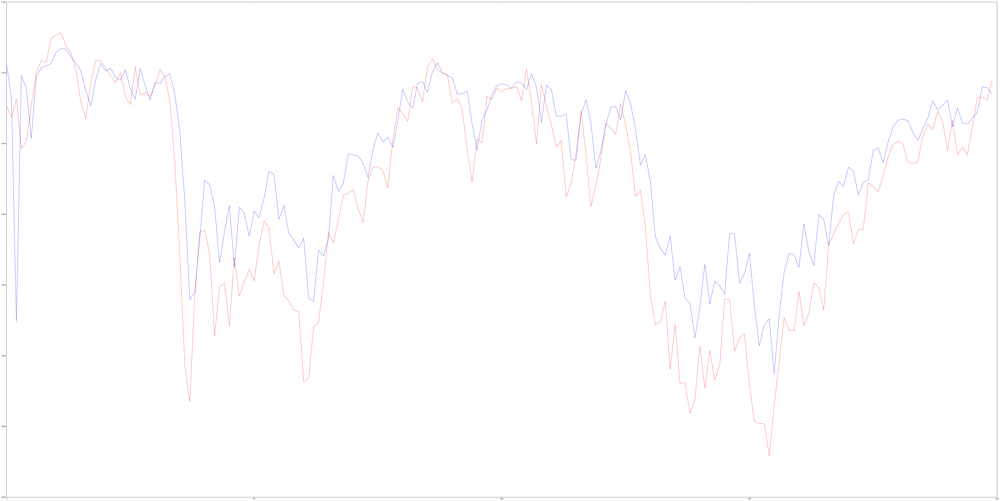

mean of test_RMSE
65.0213777533
std of test_RMSE
6.99439825438
mean of test_r2Score
0.806765038126
std of test_r2Score
0.0428804645941
mean of accuracy_all
0.546036644165
std of accuracy_all
0.0227309808077
mean of accuracy_30
0.658064516129
std of accuracy_30
0.0855903171705


NameError: name 'neurons' is not defined

In [11]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for epoch in epochs:
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
        #model.add(Dropout(  ))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(epoch):
            model.fit(trainX, trainY, epochs=1, batch_size=1, verbose=0, shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(neurons,test_RMSE_all)
plt.xlabel('neurons')
plt.ylabel('test_RMSE')
plt.show()

plt.plot(neurons,accuracy_all_all)
plt.xlabel('neurons')
plt.ylabel('accuracy_all')
plt.show()


print('time cost')
print( time.time() - start)  

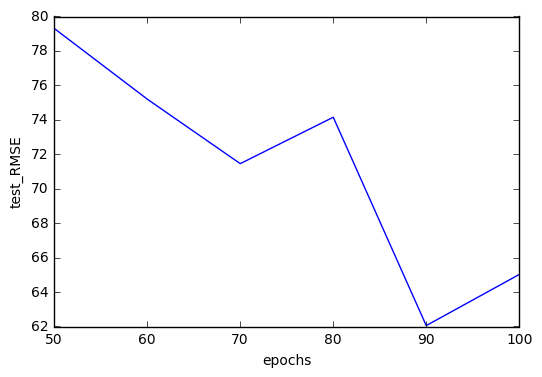

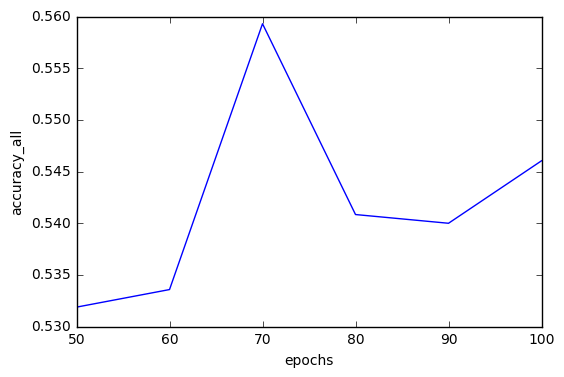

In [12]:
plt.plot(epochs,test_RMSE_all)
plt.xlabel('epochs')
plt.ylabel('test_RMSE')
plt.show()

plt.plot(epochs,accuracy_all_all)
plt.xlabel('epochs')
plt.ylabel('accuracy_all')
plt.show()


4.7 compare stateless with stateful

4.7.1 stateless,shuffle=True

In [13]:
repeats=5

accuracy plot


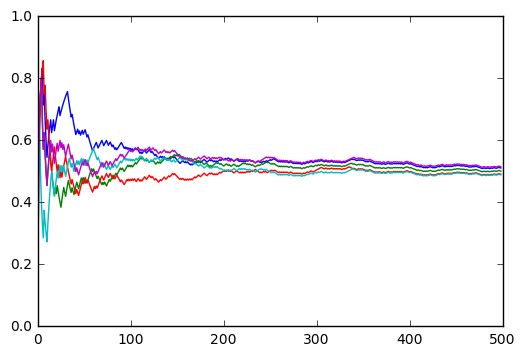

adjclose plot


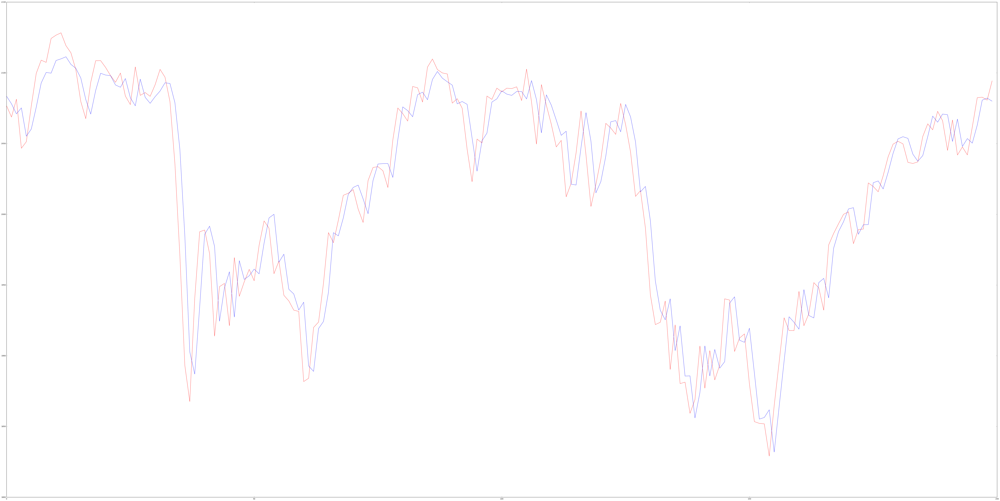

mean of test_RMSE
71.703236845
std of test_RMSE
12.1583274965
mean of test_r2Score
0.76101804917
std of test_r2Score
0.079800347473
mean of accuracy_all
0.519912568525
std of accuracy_all
0.0197911634625
mean of accuracy_30
0.548387096774
std of accuracy_30
0.107956132456
time cost
2861.4536657333374


In [14]:
start = time.time()

test_RMSE=[]
test_r2Score=[]
accuracy_all=[]
accuracy_30=[]

for i in range(repeats):
    trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
    # create and fit the LSTM network
    model = Sequential()
    model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
    #model.add(Dropout(  ))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(trainX, trainY, epochs=100 , batch_size=1, verbose=0,shuffle=True)

    # make predictions
    testPredict = model.predict(testX, batch_size=1)
    # invert predictions
    testPredict =  scaler_target.inverse_transform(testPredict)
    testY =  scaler_target.inverse_transform(testY)
    # calculate root mean squared error and R2 score
    test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
    test_r2Score.append(r2_score(testY, testPredict))
    #transfer to classification probelm
    test_true=testY[:]
    test_pred=testPredict[:]

    test_true_clssfi=[]
    for  i in range(1,len(test_true)):
        if test_true[i]>test_true[i-1]:
            test_true_clssfi.append(1)
        else:
            test_true_clssfi.append(0)

    test_pred_clssfi=[]
    for  i in range(1,len(test_pred)):
        if test_pred[i]>test_true[i-1]:
            test_pred_clssfi.append(1)
        else:
            test_pred_clssfi.append(0)

    accuracy=[]
    for i in range(1,len(test_pred_clssfi)+1):
        accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
    plt.plot(accuracy)
    accuracy_all.append(np.mean(accuracy))
    accuracy_30.append(np.mean(accuracy[30]))

print('accuracy plot')    
plt.show()

print('adjclose plot')  
test_true=testY[:200]
test_pred=testPredict[:200]

fig, ax = plt.subplots(figsize=(100, 50))
plt.plot(test_true,color='red')
plt.plot(test_pred,color='blue')
plt.show()

print('mean of test_RMSE')
print(np.mean(test_RMSE))

print('std of test_RMSE')
print(np.std(test_RMSE))

print('mean of test_r2Score')
print(np.mean(test_r2Score))

print('std of test_r2Score')
print(np.std(test_r2Score))

print('mean of accuracy_all')
print(np.mean(accuracy_all))

print('std of accuracy_all')
print(np.std(accuracy_all))

print('mean of accuracy_30')
print(np.mean(accuracy_30))

print('std of accuracy_30')
print(np.std(accuracy_30))

test_RMSE_all.append(np.mean(test_RMSE))
accuracy_all_all.append(np.mean(accuracy_all))

    



print('time cost')
print( time.time() - start)  

In [ ]:
4.7.1 stateless,shuffle=False

accuracy plot


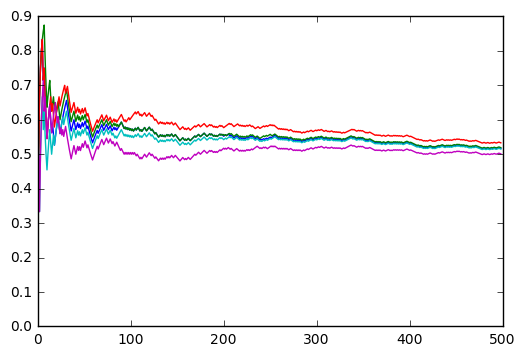

adjclose plot


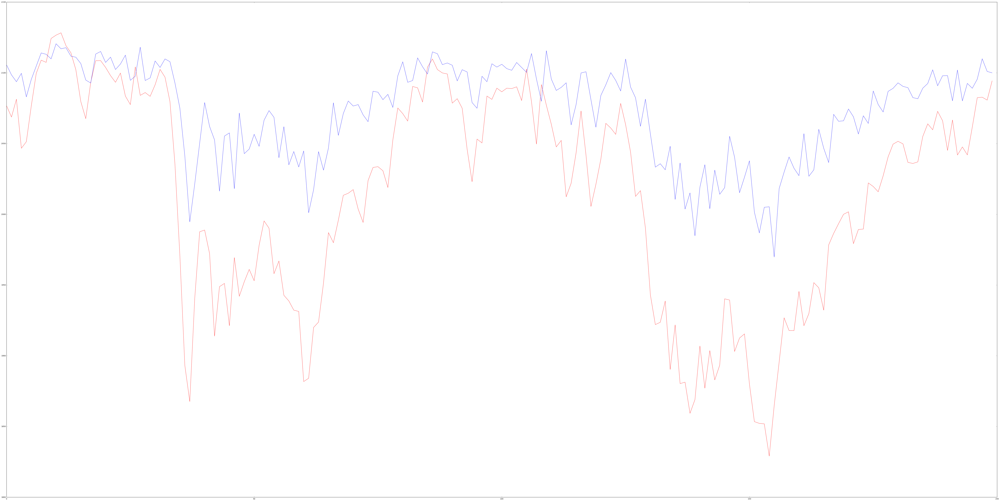

mean of test_RMSE
84.9374035028
std of test_RMSE
23.1590266104
mean of test_r2Score
0.649798569337
std of test_r2Score
0.175111111759
mean of accuracy_all
0.547482254391
std of accuracy_all
0.0212321244018
mean of accuracy_30
0.638709677419
std of accuracy_30
0.0376190444829
time cost
2906.3322327136993


In [15]:
start = time.time()
test_RMSE=[]
test_r2Score=[]
accuracy_all=[]
accuracy_30=[]

for i in range(repeats):
    trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata([Open,High,Low,Close])
    # create and fit the LSTM network
    model = Sequential()
    model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
    #model.add(Dropout(  ))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(trainX, trainY, epochs=100 , batch_size=1, verbose=0,shuffle=False)

    # make predictions
    testPredict = model.predict(testX, batch_size=1)
    # invert predictions
    testPredict =  scaler_target.inverse_transform(testPredict)
    testY =  scaler_target.inverse_transform(testY)
    # calculate root mean squared error and R2 score
    test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
    test_r2Score.append(r2_score(testY, testPredict))
    #transfer to classification probelm
    test_true=testY[:]
    test_pred=testPredict[:]

    test_true_clssfi=[]
    for  i in range(1,len(test_true)):
        if test_true[i]>test_true[i-1]:
            test_true_clssfi.append(1)
        else:
            test_true_clssfi.append(0)

    test_pred_clssfi=[]
    for  i in range(1,len(test_pred)):
        if test_pred[i]>test_true[i-1]:
            test_pred_clssfi.append(1)
        else:
            test_pred_clssfi.append(0)

    accuracy=[]
    for i in range(1,len(test_pred_clssfi)+1):
        accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
    plt.plot(accuracy)
    accuracy_all.append(np.mean(accuracy))
    accuracy_30.append(np.mean(accuracy[30]))

print('accuracy plot')    
plt.show()

print('adjclose plot')  
test_true=testY[:200]
test_pred=testPredict[:200]

fig, ax = plt.subplots(figsize=(100, 50))
plt.plot(test_true,color='red')
plt.plot(test_pred,color='blue')
plt.show()

print('mean of test_RMSE')
print(np.mean(test_RMSE))

print('std of test_RMSE')
print(np.std(test_RMSE))

print('mean of test_r2Score')
print(np.mean(test_r2Score))

print('std of test_r2Score')
print(np.std(test_r2Score))

print('mean of accuracy_all')
print(np.mean(accuracy_all))

print('std of accuracy_all')
print(np.std(accuracy_all))

print('mean of accuracy_30')
print(np.mean(accuracy_30))

print('std of accuracy_30')
print(np.std(accuracy_30))

test_RMSE_all.append(np.mean(test_RMSE))
accuracy_all_all.append(np.mean(accuracy_all))

    



print('time cost')
print( time.time() - start)  

4.8 compare with 15 steps

In [16]:
def preparedata_steps(steps):
    df=pd.read_csv('SP500_new.csv', engine='python', skipfooter=1)
    #data=df.drop(['Date'], axis = 1)
    data=df.drop(['Date', 'Adj Close','Volume'], axis = 1)
    # normalize the dataset
    scaler_dataset = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler_dataset.fit_transform(data)
    
    target=df['Adj Close']
    # normalize the dataset
    scaler_target = MinMaxScaler(feature_range=(0, 1))
    target = scaler_target.fit_transform(target)
    
    result = []
    for index in range(len(dataset) - steps): # maxmimum date = lastest date - sequence length
            result.append(dataset[index: index + steps]) # index : index + steps
            
    result = np.array(result)
    
    features=result[:]
    target=target[steps:]
    
    trainX=features[:-500]
    testX=features[-500:]
    trainY=target[:-500]
    testY=target[-500:]
    return trainX,trainY,testX,testY,scaler_dataset,scaler_target

C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


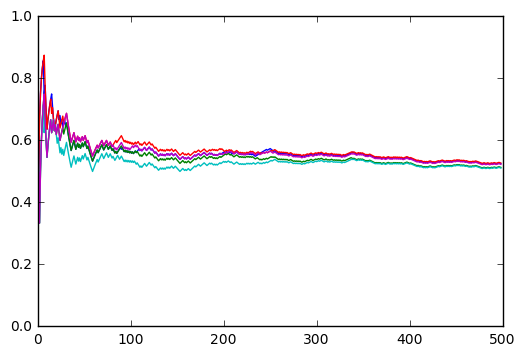

adjclose plot


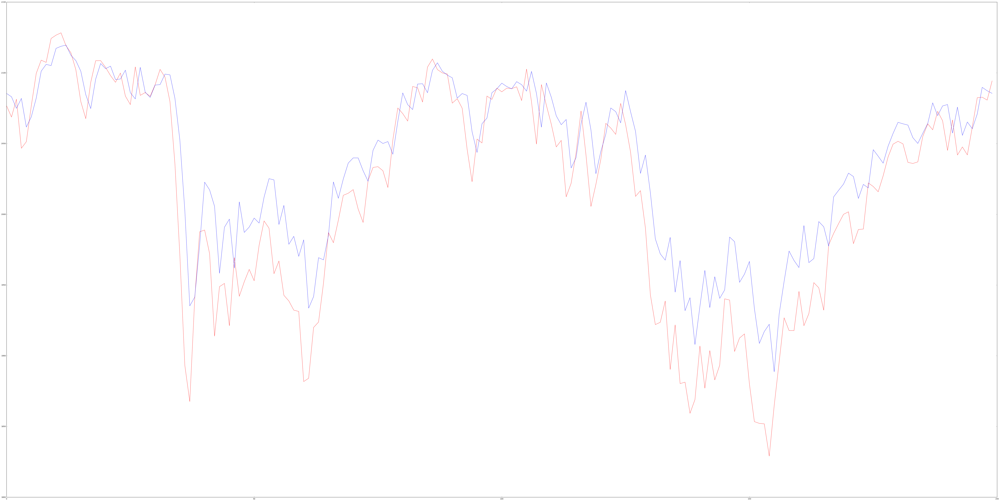

mean of test_RMSE
74.4946081799
std of test_RMSE
20.3894144167
mean of test_r2Score
0.730474418313
std of test_r2Score
0.151730917319
mean of accuracy_all
0.549656150399
std of accuracy_all
0.0181688515762
mean of accuracy_30
0.641935483871
std of accuracy_30
0.03663811836


In [17]:
for i in range(repeats):


    trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata_steps(15)
    # create and fit the LSTM network
    model = Sequential()
    model.add(LSTM(7, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
    #model.add(Dropout(  ))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    for i in range(100):
        model.fit(trainX,trainY,epochs=1,batch_size=1,verbose=0,shuffle=False)
        model.reset_states()

    # make predictions
    testPredict = model.predict(testX, batch_size=1)
    # invert predictions
    testPredict =  scaler_target.inverse_transform(testPredict)
    testY =  scaler_target.inverse_transform(testY)
    # calculate root mean squared error and R2 score
    test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
    test_r2Score.append(r2_score(testY, testPredict))
    #transfer to classification probelm
    test_true=testY[:]
    test_pred=testPredict[:]

    test_true_clssfi=[]
    for  i in range(1,len(test_true)):
        if test_true[i]>test_true[i-1]:
            test_true_clssfi.append(1)
        else:
            test_true_clssfi.append(0)

    test_pred_clssfi=[]
    for  i in range(1,len(test_pred)):
        if test_pred[i]>test_true[i-1]:
            test_pred_clssfi.append(1)
        else:
            test_pred_clssfi.append(0)

    accuracy=[]
    for i in range(1,len(test_pred_clssfi)+1):
        accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
    plt.plot(accuracy)
    accuracy_all.append(np.mean(accuracy))
    accuracy_30.append(np.mean(accuracy[30]))

print('accuracy plot')    
plt.show()

print('adjclose plot')  
test_true=testY[:200]
test_pred=testPredict[:200]

fig, ax = plt.subplots(figsize=(100, 50))
plt.plot(test_true,color='red')
plt.plot(test_pred,color='blue')
plt.show()

print('mean of test_RMSE')
print(np.mean(test_RMSE))

print('std of test_RMSE')
print(np.std(test_RMSE))

print('mean of test_r2Score')
print(np.mean(test_r2Score))

print('std of test_r2Score')
print(np.std(test_r2Score))

print('mean of accuracy_all')
print(np.mean(accuracy_all))

print('std of accuracy_all')
print(np.std(accuracy_all))

print('mean of accuracy_30')
print(np.mean(accuracy_30))

print('std of accuracy_30')
print(np.std(accuracy_30))

test_RMSE_all.append(np.mean(test_RMSE))
accuracy_all_all.append(np.mean(accuracy_all))
